In [1]:
from resGAN_64 import Discriminator, Generator
import torch
from torchvision import transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import RandomSampler
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
from torch_snippets import *
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# models

In [2]:
discriminator = Discriminator().to(device)
generator = Generator(noise_dim=512,final_activation="tanh").to(device)
discriminator.load_state_dict(torch.load("face_resGAN/discriminator.pth"))
generator.load_state_dict(torch.load("face_resGAN/generator.pth"))

<All keys matched successfully>

# data pipeline

In [3]:
import os
os.listdir("../../Datasets/male_female_face_images")

['females', 'males']

In [4]:
img_transform = transforms.Compose([
    transforms.Resize([64,64]),
    transforms.RandomHorizontalFlip(0.5),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [5]:
from PIL import Image
class face_dataset(Dataset):
    def __init__(self, folder_path = "../../Datasets/male_female_face_images",transform=img_transform):
        super().__init__()
        male_paths = [folder_path+"/males/"+name for name in os.listdir(folder_path+"/males")]
        female_paths = [folder_path+"/females/"+name for name in os.listdir(folder_path+"/females")]
        male_paths.extend(female_paths)
        self.image_paths = male_paths
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image


28636

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


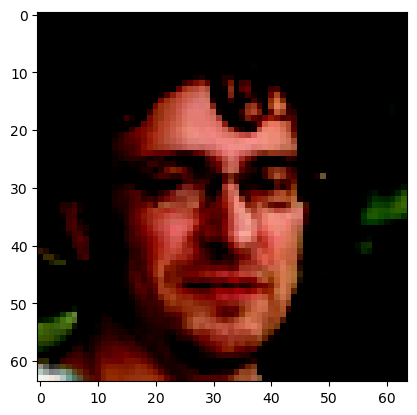

In [6]:
ds = face_dataset()
print(len(ds))
img1 = ds[1]
plt.imshow(img1.numpy().transpose(1,2,0))


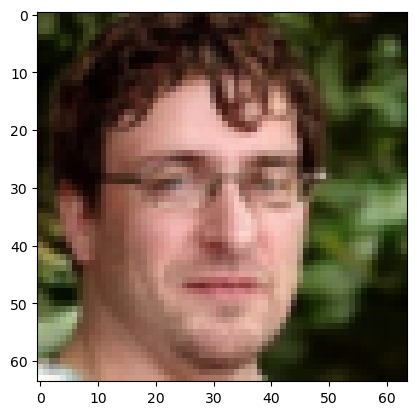

In [7]:
plt.imshow(np.transpose(torchvision.utils.make_grid(img1[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [8]:
batch_size = 128
dataloader = DataLoader(ds,batch_size,shuffle=True)
len(dataloader)

224

In [9]:
real_batch = next(iter(dataloader))
real_batch.shape

torch.Size([128, 3, 64, 64])

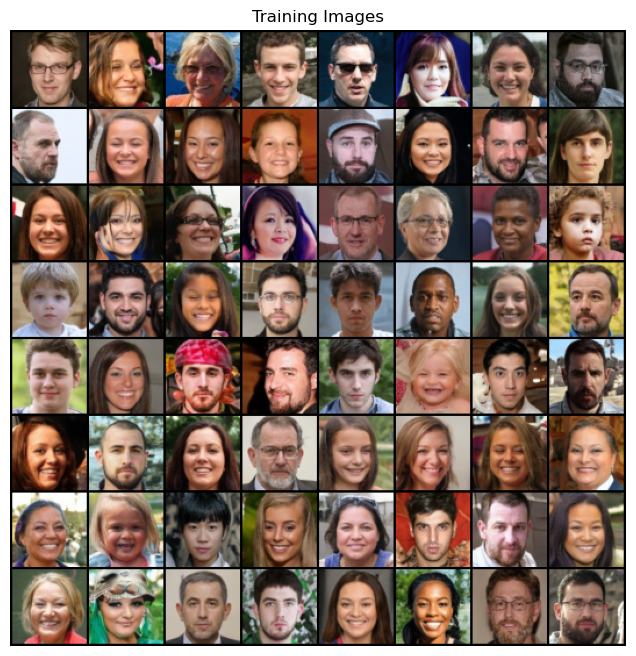

In [10]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

# training routine

In [9]:
def train_discriminator(discriminator,fake_data,real_data,loss_fn,optimizer):
    optimizer.zero_grad()
    pred_fake = discriminator(fake_data)
    loss_fake = loss_fn(pred_fake,torch.full(size=(len(fake_data),1),fill_value=0.1).to(device))
    loss_fake.backward()
    pred_real = discriminator(real_data)
    loss_real = loss_fn(pred_real,torch.full(size=(len(real_data),1),fill_value=0.9).to(device))
    loss_real.backward()
    optimizer.step()
    return loss_real, loss_fake

In [10]:
def train_generator(discriminator, fake_data, loss_fn, optimizer):
    optimizer.zero_grad()
    pred = discriminator(fake_data)
    loss = loss_fn(pred,torch.full(size=(len(fake_data),1),fill_value=0.9).to(device))
    loss.backward()
    optimizer.step()
    return loss

In [11]:
def noise_generator(batch_size=128,noise_dim=1024):
    return torch.randn((batch_size,noise_dim)).to(device)

In [12]:
model_name = "face_resGAN"
if not os.path.exists(model_name):
    os.makedirs(model_name)

In [14]:
loss_fn = torch.nn.BCEWithLogitsLoss()
d_optimizer = torch.optim.AdamW(discriminator.parameters(),lr=4e-6)
g_optimizer = torch.optim.AdamW(generator.parameters(),lr=4e-6)

EPOCH: 5.000  d_loss: 1.403  real_loss: 0.683  g_loss: 1.377  fake_loss: 0.720  (1288.81s - 14176.93s remaining)
EPOCH: 10.000  d_loss: 1.385  real_loss: 0.690  g_loss: 1.421  fake_loss: 0.695  (2582.80s - 12913.98s remaining)
EPOCH: 15.000  d_loss: 1.401  real_loss: 0.701  g_loss: 1.408  fake_loss: 0.701  (3871.72s - 11615.15s remaining)
EPOCH: 20.000  d_loss: 1.407  real_loss: 0.703  g_loss: 1.396  fake_loss: 0.705  (5160.10s - 10320.21s remaining)


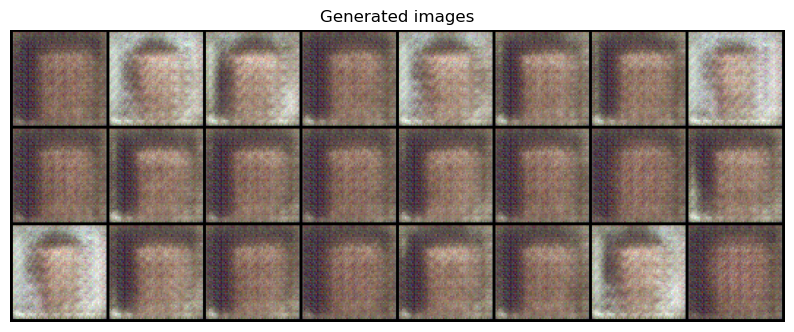

EPOCH: 25.000  d_loss: 1.403  real_loss: 0.700  g_loss: 1.394  fake_loss: 0.703  (6449.34s - 9029.07s remaining))
EPOCH: 30.000  d_loss: 1.399  real_loss: 0.701  g_loss: 1.401  fake_loss: 0.698  (7738.29s - 7738.29s remaining)
EPOCH: 35.000  d_loss: 1.394  real_loss: 0.698  g_loss: 1.404  fake_loss: 0.696  (9027.65s - 6448.32s remaining)
EPOCH: 40.000  d_loss: 1.394  real_loss: 0.697  g_loss: 1.401  fake_loss: 0.697  (10317.07s - 5158.53s remaining)


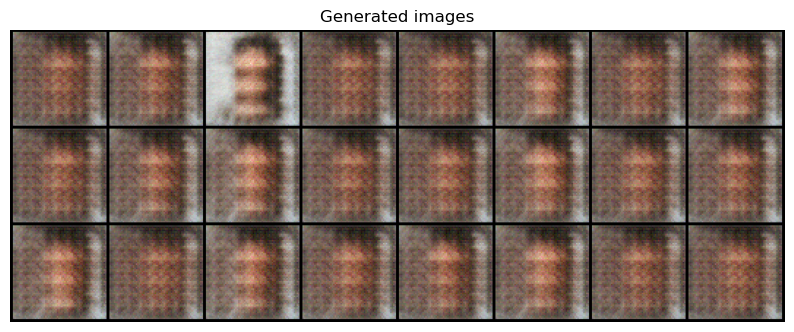

EPOCH: 45.000  d_loss: 1.386  real_loss: 0.688  g_loss: 1.397  fake_loss: 0.698  (11607.16s - 3869.05s remaining)
EPOCH: 50.000  d_loss: 1.395  real_loss: 0.697  g_loss: 1.397  fake_loss: 0.697  (12895.95s - 2579.19s remaining)
EPOCH: 55.000  d_loss: 1.396  real_loss: 0.699  g_loss: 1.397  fake_loss: 0.697  (14185.02s - 1289.55s remaining)
EPOCH: 60.000  d_loss: 1.397  real_loss: 0.696  g_loss: 1.387  fake_loss: 0.701  (15474.46s - 0.00s remaining))))


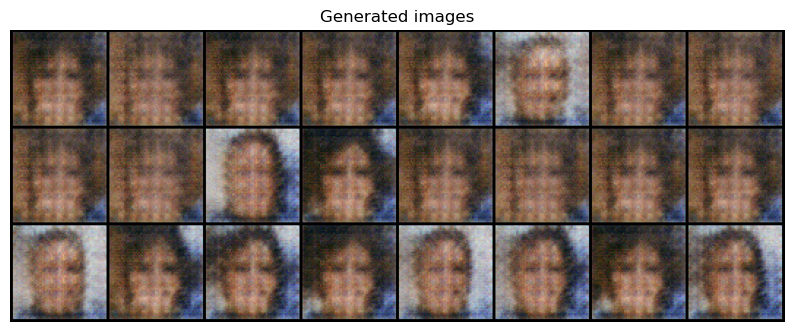

100%|██████████| 161/161 [00:00<00:00, 438.63it/s]


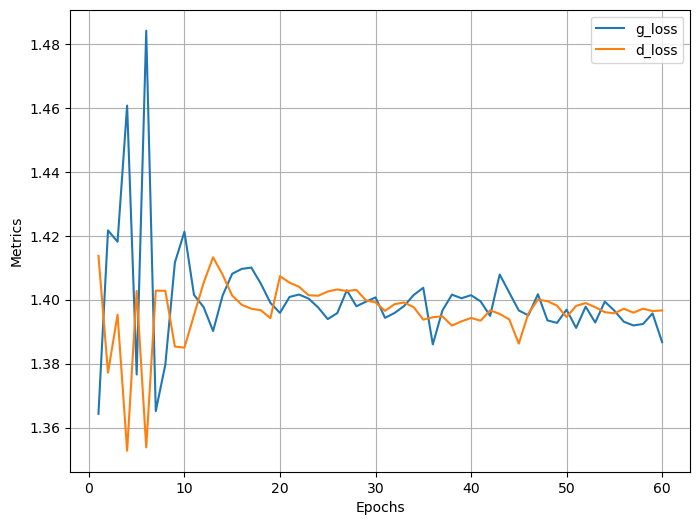

In [18]:
N = len(dataloader)
num_epochs = 60
log = Report(num_epochs)
repeat_generator=2
noise_dim = 512
batch_size = 128

for epoch in range(num_epochs):
    for idx, imgs in enumerate(dataloader):
        real_data = imgs.to(device)
        fake_data = generator(noise_generator(batch_size,noise_dim).to(device))
        fake_data = fake_data.detach()
        real_loss, fake_loss = train_discriminator(discriminator,fake_data,real_data,loss_fn,d_optimizer)
        real_loss, fake_loss = real_loss.item(), fake_loss.item()
        d_total = real_loss + fake_loss
        g_total = 0
        g_batch = 0
        #while g_avg >= 3:
        for i in range(repeat_generator):
            fake_data = generator(noise_generator(batch_size,noise_dim).to(device))
            g_loss = train_generator(discriminator,fake_data,loss_fn,g_optimizer)
            g_total += g_loss.item()

        log.record(epoch+(idx+1)/N,g_loss = g_total, d_loss = d_total, real_loss = real_loss, fake_loss = fake_loss, end='\r')
    if (epoch+1)%5 == 0:
        log.report_avgs(epoch+1)
    if (epoch+1)%20 == 0:
        generator.eval()
        noise = torch.randn(24, 512, device=device)
        sample_images = generator(noise).detach().cpu()
        grid = torchvision.utils.make_grid(sample_images, nrow=8, normalize=True)
        show(grid.cpu().detach().permute(1,2,0), sz=10, title='Generated images')
log.plot_epochs(['g_loss','d_loss'])
torch.save(generator.state_dict(),model_name+r'/generator.pth')
torch.save(discriminator.state_dict(),model_name+r"/discriminator.pth")

EPOCH: 5.000  real_loss: 0.336  g_loss: 1.882  fake_loss: 0.334  d_loss: 0.670  (780.49s - 17951.25s remaining)
EPOCH: 10.000  real_loss: 0.328  g_loss: 2.090  fake_loss: 0.329  d_loss: 0.657  (1550.12s - 17051.27s remaining)


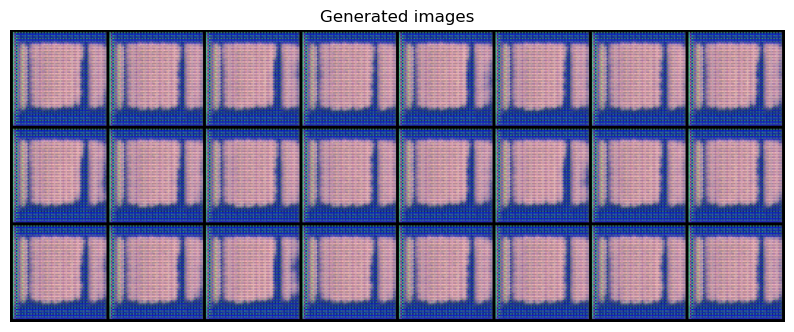

EPOCH: 15.000  real_loss: 0.328  g_loss: 2.085  fake_loss: 0.329  d_loss: 0.657  (2299.69s - 16097.84s remaining)
EPOCH: 20.000  real_loss: 0.704  g_loss: 0.672  fake_loss: 0.726  d_loss: 1.430  (3047.05s - 15235.26s remaining)


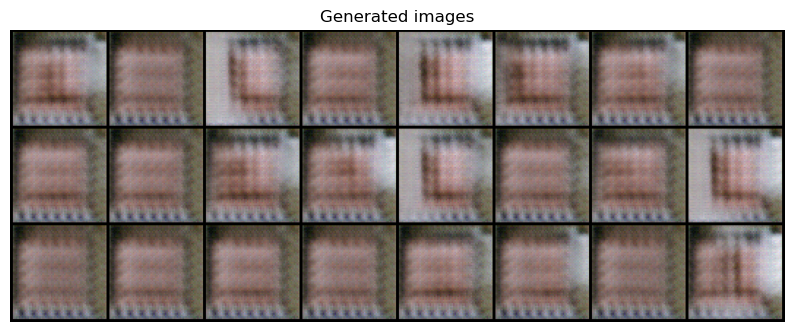

EPOCH: 25.000  real_loss: 0.707  g_loss: 0.698  fake_loss: 0.699  d_loss: 1.406  (3795.80s - 14424.02s remaining)
EPOCH: 30.000  real_loss: 0.700  g_loss: 0.693  fake_loss: 0.700  d_loss: 1.400  (4543.08s - 13629.25s remaining)


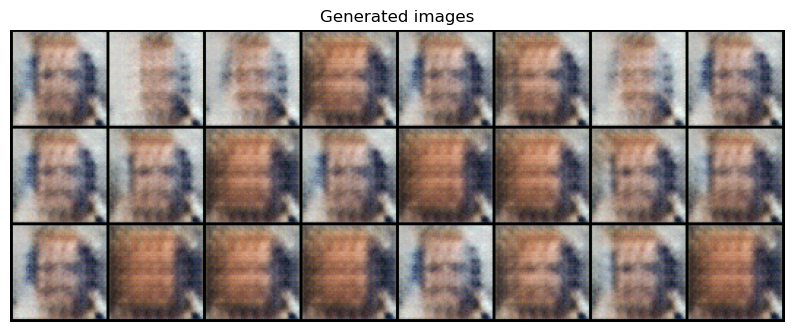

EPOCH: 35.000  real_loss: 0.692  g_loss: 0.694  fake_loss: 0.699  d_loss: 1.391  (5291.88s - 12851.70s remaining)
EPOCH: 40.000  real_loss: 0.672  g_loss: 0.737  fake_loss: 0.702  d_loss: 1.374  (6039.81s - 12079.61s remaining)


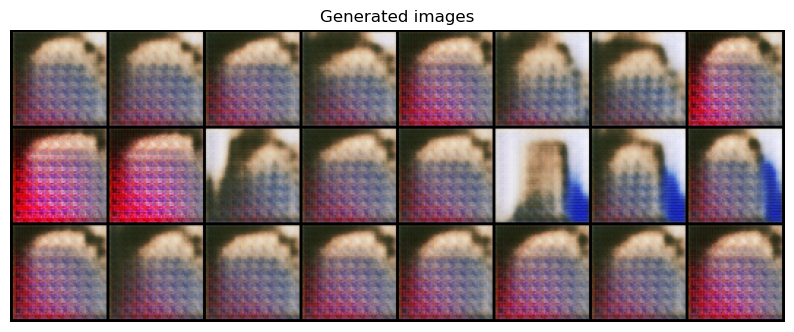

EPOCH: 45.000  real_loss: 0.694  g_loss: 0.691  fake_loss: 0.701  d_loss: 1.395  (6788.79s - 11314.65s remaining)
EPOCH: 50.000  real_loss: 0.693  g_loss: 0.691  fake_loss: 0.701  d_loss: 1.394  (7536.29s - 10550.80s remaining)


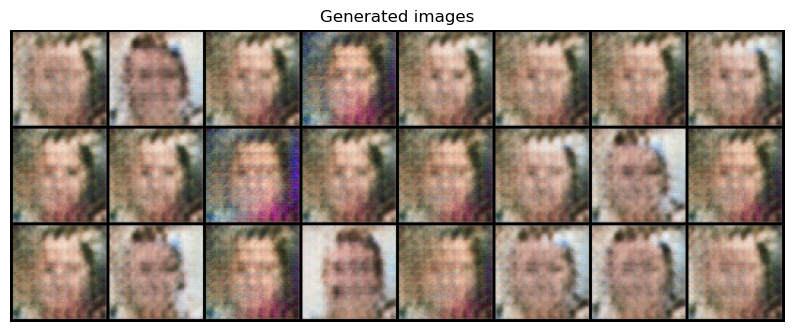

EPOCH: 55.000  real_loss: 0.696  g_loss: 0.695  fake_loss: 0.696  d_loss: 1.392  (8285.16s - 9791.55s remaining))
EPOCH: 60.000  real_loss: 0.695  g_loss: 0.696  fake_loss: 0.694  d_loss: 1.390  (9032.92s - 9032.92s remaining)


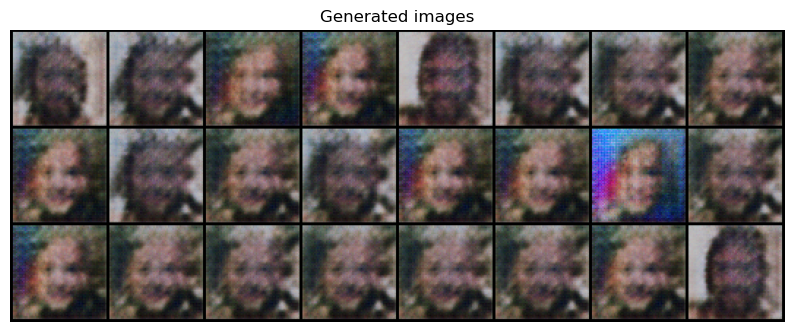

EPOCH: 65.000  real_loss: 0.693  g_loss: 0.695  fake_loss: 0.696  d_loss: 1.389  (9782.39s - 8277.40s remaining)
EPOCH: 70.000  real_loss: 0.696  g_loss: 0.703  fake_loss: 0.690  d_loss: 1.386  (10530.14s - 7521.53s remaining)


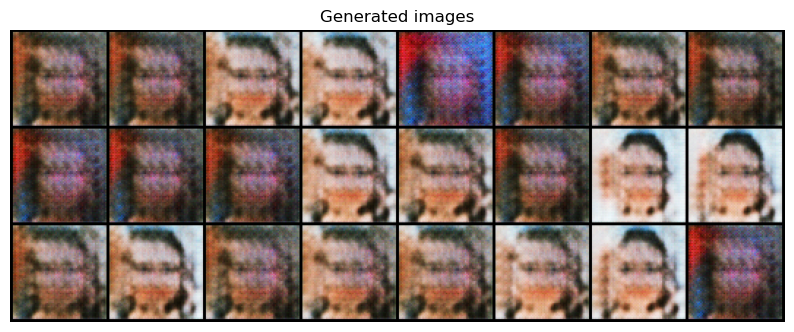

EPOCH: 75.000  real_loss: 0.694  g_loss: 0.696  fake_loss: 0.693  d_loss: 1.388  (11279.39s - 6767.63s remaining)
EPOCH: 80.000  real_loss: 0.695  g_loss: 0.694  fake_loss: 0.696  d_loss: 1.391  (12027.31s - 6013.66s remaining)


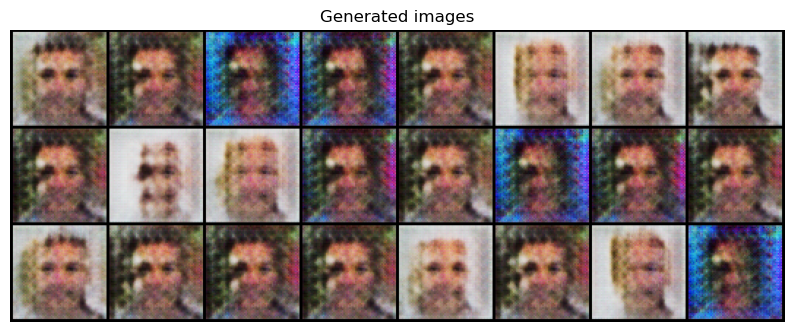

EPOCH: 85.000  real_loss: 0.697  g_loss: 0.699  fake_loss: 0.692  d_loss: 1.389  (12776.51s - 5260.92s remaining)
EPOCH: 90.000  real_loss: 0.693  g_loss: 0.696  fake_loss: 0.694  d_loss: 1.387  (13525.02s - 4508.34s remaining)


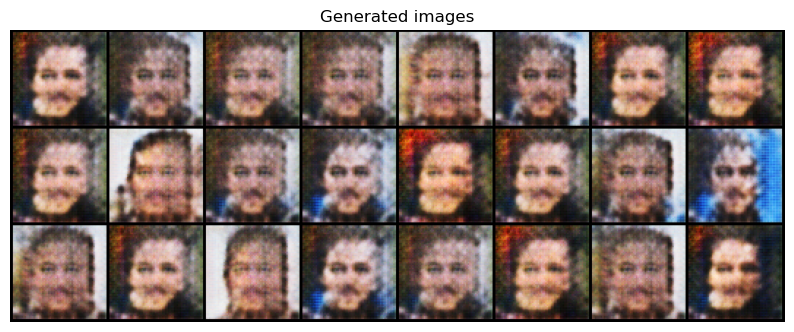

EPOCH: 95.000  real_loss: 0.697  g_loss: 0.720  fake_loss: 0.672  d_loss: 1.369  (14274.39s - 3756.42s remaining)
EPOCH: 100.000  real_loss: 0.695  g_loss: 0.701  fake_loss: 0.689  d_loss: 1.384  (15022.49s - 3004.50s remaining)


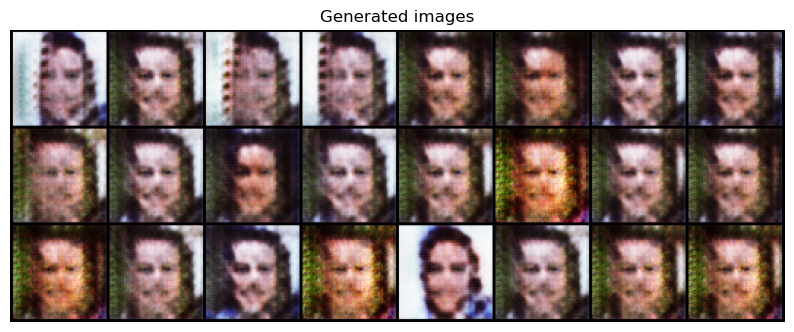

EPOCH: 105.000  real_loss: 0.697  g_loss: 0.699  fake_loss: 0.693  d_loss: 1.391  (15771.84s - 2253.12s remaining)
EPOCH: 110.000  real_loss: 0.697  g_loss: 0.695  fake_loss: 0.695  d_loss: 1.392  (16524.78s - 1502.25s remaining)


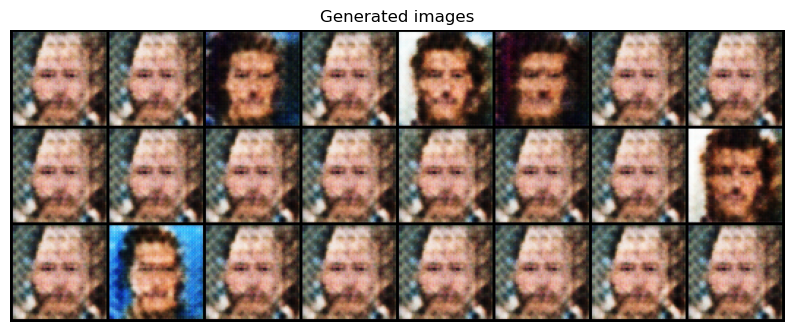

EPOCH: 115.000  real_loss: 0.694  g_loss: 0.693  fake_loss: 0.697  d_loss: 1.391  (17277.61s - 751.20s remaining))
EPOCH: 120.000  real_loss: 0.694  g_loss: 0.693  fake_loss: 0.695  d_loss: 1.390  (18029.22s - 0.00s remaining)))


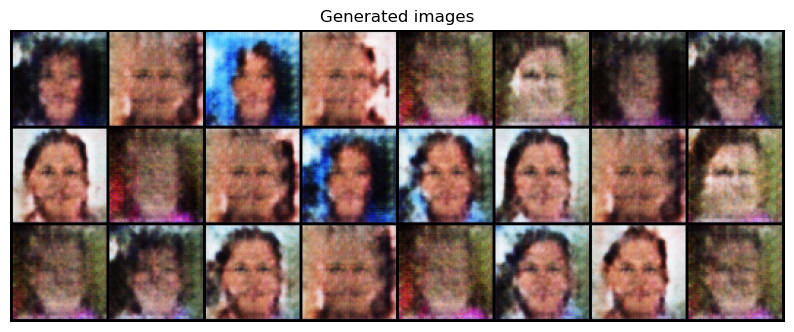

100%|██████████| 221/221 [00:00<00:00, 251.39it/s]


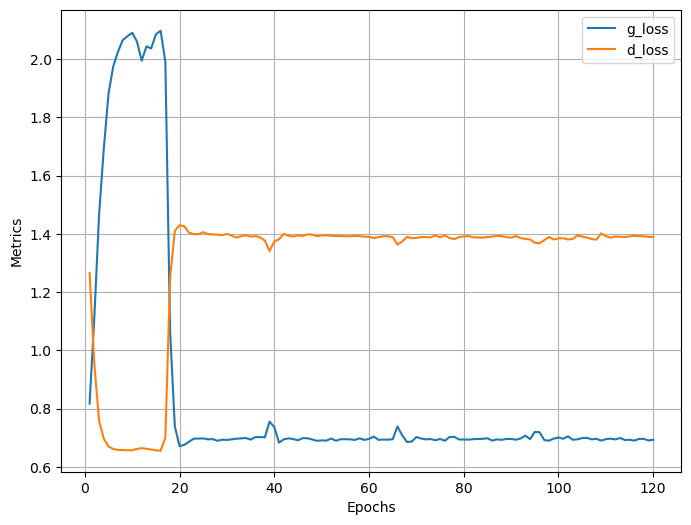

In [15]:
N = len(dataloader)
num_epochs = 120
log = Report(num_epochs)
repeat_generator=1
noise_dim = 512
batch_size = 128

for epoch in range(num_epochs):
    for idx, imgs in enumerate(dataloader):
        real_data = imgs.to(device)
        fake_data = generator(noise_generator(batch_size,noise_dim).to(device))
        fake_data = fake_data.detach()
        real_loss, fake_loss = train_discriminator(discriminator,fake_data,real_data,loss_fn,d_optimizer)
        real_loss, fake_loss = real_loss.item(), fake_loss.item()
        d_total = real_loss + fake_loss
        g_total = 0
        g_batch = 0
        #while g_avg >= 3:
        for i in range(repeat_generator):
            fake_data = generator(noise_generator(batch_size,noise_dim).to(device))
            g_loss = train_generator(discriminator,fake_data,loss_fn,g_optimizer)
            g_total += g_loss.item()

        log.record(epoch+(idx+1)/N,g_loss = g_total, d_loss = d_total, real_loss = real_loss, fake_loss = fake_loss, end='\r')
    if (epoch+1)%5 == 0:
        log.report_avgs(epoch+1)
    if (epoch+1)%10 == 0:
        torch.save(generator.state_dict(),model_name+r'/generator2.pth')
        torch.save(discriminator.state_dict(),model_name+r"/discriminator2.pth")
        generator.eval()
        noise = torch.randn(24, 512, device=device)
        sample_images = generator(noise).detach().cpu()
        grid = torchvision.utils.make_grid(sample_images, nrow=8, normalize=True)
        show(grid.cpu().detach().permute(1,2,0), sz=10, title='Generated images')
log.plot_epochs(['g_loss','d_loss'])
# torch.save(generator.state_dict(),model_name+r'/generator2.pth')
# torch.save(discriminator.state_dict(),model_name+r"/discriminator2.pth")

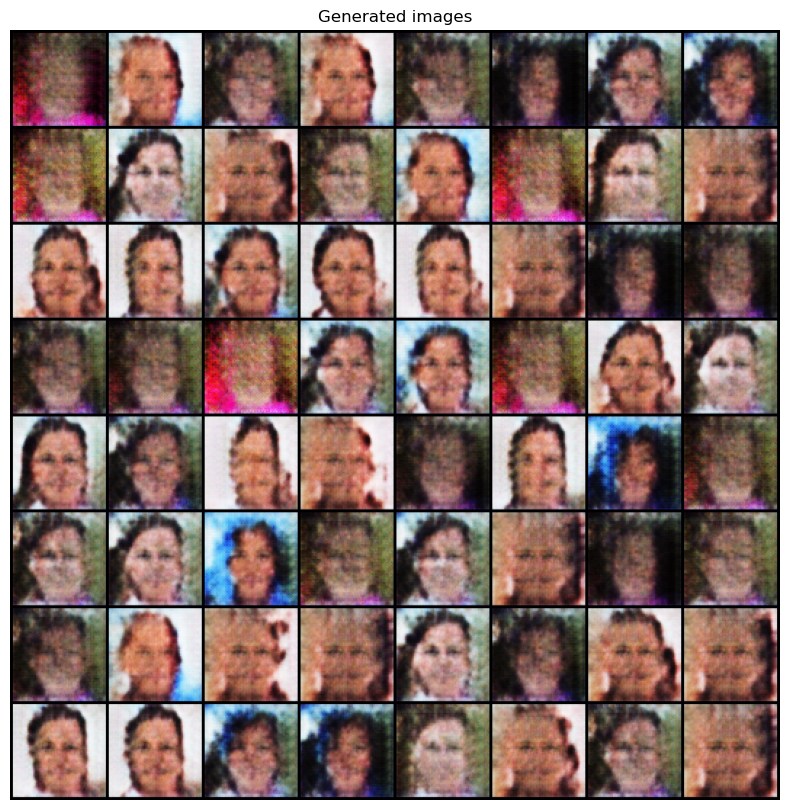

In [20]:
generator.eval()
noise = torch.randn(64, 512, device=device)
sample_images = generator(noise).detach().cpu()
grid = torchvision.utils.make_grid(sample_images, nrow=8, normalize=True)
show(grid.cpu().detach().permute(1,2,0), sz=10, title='Generated images')

EPOCH: 5.000  real_loss: 0.693  g_loss: 0.693  fake_loss: 0.695  d_loss: 1.389  (752.26s - 3761.32s remaining)
EPOCH: 10.000  real_loss: 0.696  g_loss: 0.695  fake_loss: 0.693  d_loss: 1.388  (1501.39s - 3002.78s remaining)


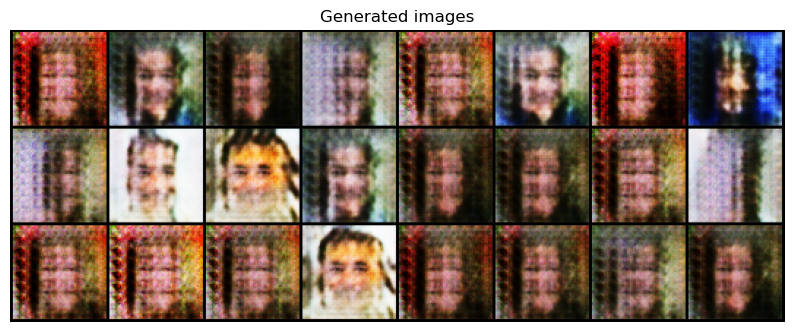

EPOCH: 15.000  real_loss: 0.692  g_loss: 0.693  fake_loss: 0.695  d_loss: 1.387  (2253.30s - 2253.30s remaining)
EPOCH: 20.000  real_loss: 0.677  g_loss: 0.704  fake_loss: 0.685  d_loss: 1.362  (3003.64s - 1501.82s remaining)


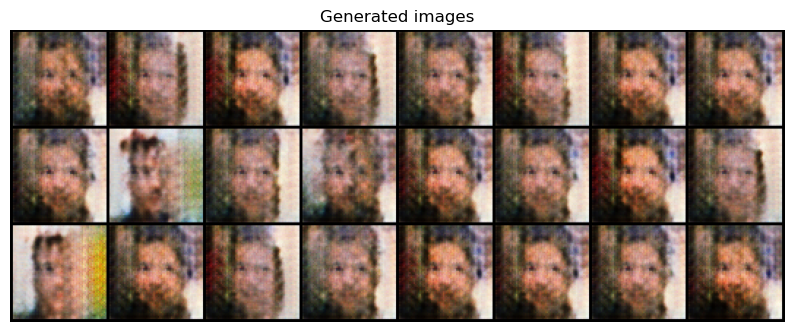

EPOCH: 21.808  g_loss: 0.702  d_loss: 1.393  real_loss: 0.677  fake_loss: 0.716  (3276.25s - 1230.69s remaining)

KeyboardInterrupt: 

In [21]:
N = len(dataloader)
num_epochs = 30
log = Report(num_epochs)
repeat_generator=1
noise_dim = 512
batch_size = 128

for epoch in range(num_epochs):
    for idx, imgs in enumerate(dataloader):
        real_data = imgs.to(device)
        fake_data = generator(noise_generator(batch_size,noise_dim).to(device))
        fake_data = fake_data.detach()
        real_loss, fake_loss = train_discriminator(discriminator,fake_data,real_data,loss_fn,d_optimizer)
        real_loss, fake_loss = real_loss.item(), fake_loss.item()
        d_total = real_loss + fake_loss
        g_total = 0
        g_batch = 0
        #while g_avg >= 3:
        for i in range(repeat_generator):
            fake_data = generator(noise_generator(batch_size,noise_dim).to(device))
            g_loss = train_generator(discriminator,fake_data,loss_fn,g_optimizer)
            g_total += g_loss.item()

        log.record(epoch+(idx+1)/N,g_loss = g_total, d_loss = d_total, real_loss = real_loss, fake_loss = fake_loss, end='\r')
    if (epoch+1)%5 == 0:
        log.report_avgs(epoch+1)
    if (epoch+1)%10 == 0:
        torch.save(generator.state_dict(),model_name+r'/generator3.pth')
        torch.save(discriminator.state_dict(),model_name+r"/discriminator3.pth")
        generator.eval()
        noise = torch.randn(24, 512, device=device)
        sample_images = generator(noise).detach().cpu()
        grid = torchvision.utils.make_grid(sample_images, nrow=8, normalize=True)
        show(grid.cpu().detach().permute(1,2,0), sz=10, title='Generated images')
log.plot_epochs(['g_loss','d_loss'])
# torch.save(generator.state_dict(),model_name+r'/generator2.pth')
# torch.save(discriminator.state_dict(),model_name+r"/discriminator2.pth")

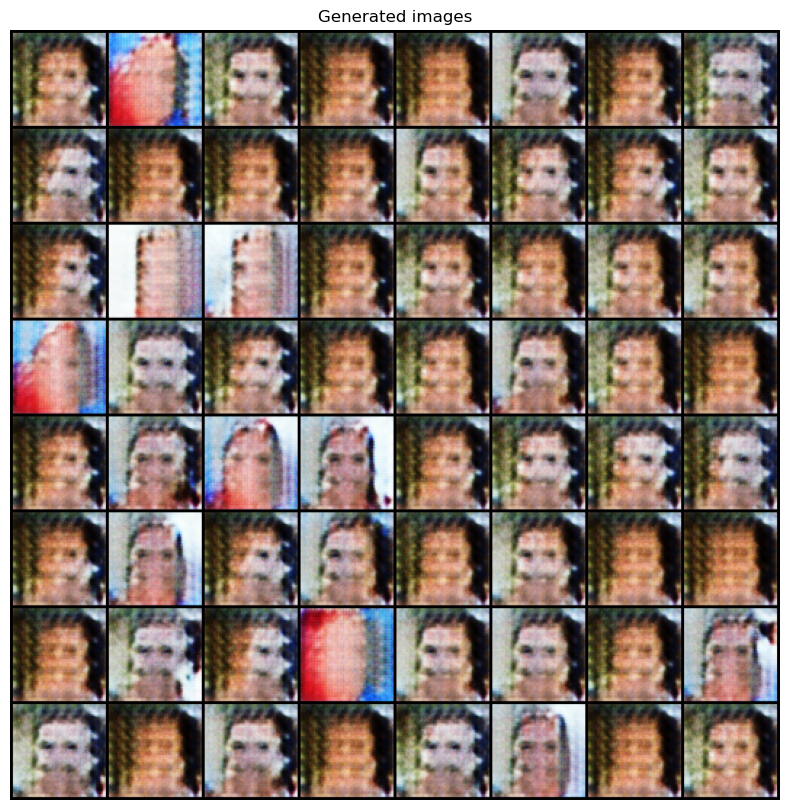

In [22]:
generator.eval()
noise = torch.randn(64, 512, device=device)
sample_images = generator(noise).detach().cpu()
grid = torchvision.utils.make_grid(sample_images, nrow=8, normalize=True)
show(grid.cpu().detach().permute(1,2,0), sz=10, title='Generated images')